In [1]:
!python --version

Python 3.9.12


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [ ]:
#!curl -L "https://app.roboflow.com/ds/hU1VnPGbXE?key=KjEBGMQ5gt" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [ ]:
import detectron2

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [10/13 05:57:50 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/13 05:57:50 d2.data.datasets.coco]: Loaded 759 images in COCO format from /content/train/_annotations.coco.json


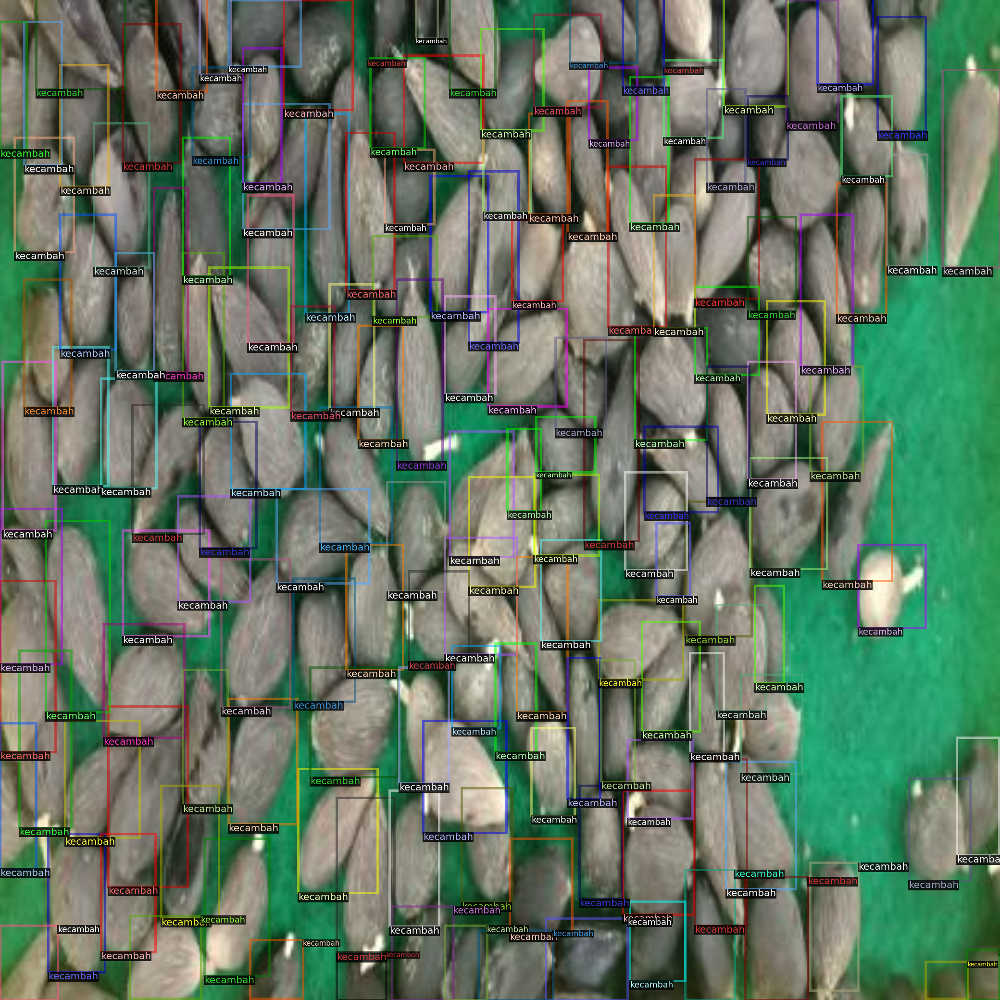

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/13 05:58:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:07, 32.5MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/13 05:58:17 d2.engine.train_loop]: Starting training from iteration 0
[10/13 05:58:38 d2.utils.events]:  eta: 0:25:17  iter: 19  total_loss: 4.705  loss_cls: 1.747  loss_box_reg: 0.486  loss_rpn_cls: 2.293  loss_rpn_loc: 0.199  time: 1.0161  data_time: 0.0368  lr: 0.000020  max_mem: 5098M
[10/13 05:58:59 d2.utils.events]:  eta: 0:25:23  iter: 39  total_loss: 2.379  loss_cls: 1.399  loss_box_reg: 0.569  loss_rpn_cls: 0.222  loss_rpn_loc: 0.170  time: 1.0304  data_time: 0.0131  lr: 0.000040  max_mem: 5485M
[10/13 05:59:19 d2.utils.events]:  eta: 0:24:43  iter: 59  total_loss: 1.872  loss_cls: 0.958  loss_box_reg: 0.576  loss_rpn_cls: 0.184  loss_rpn_loc: 0.168  time: 1.0282  data_time: 0.0116  lr: 0.000060  max_mem: 5769M
[10/13 05:59:40 d2.utils.events]:  eta: 0:24:27  iter: 79  total_loss: 1.546  loss_cls: 0.658  loss_box_reg: 0.548  loss_rpn_cls: 0.160  loss_rpn_loc: 0.159  time: 1.0293  data_time: 0.0134  lr: 0.000080  max_mem: 5769M
[10/13 06:00:01 d2.utils.events]:  eta: 0:24:0

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
import os

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [10/13 06:25:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/13 06:25:48 d2.data.datasets.coco]: Loaded 32 images in COCO format from /content/test/_annotations.coco.json
[10/13 06:25:48 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  kecambah  | 0            |  kecambah  | 7382         | kecambahd  | 0            |
|            |              |            |              |            |              |
|   total    | 7382         |            |              |            |              |
[10/13 06:25:48 d2.data.common]: Serializing 32 elements to byte tensors and concatenating them all ...
[10/13 06:25:48 d2.data.common]: Serialized dataset takes 0.27 MiB
[10/13 06:25:48 d2.evaluation.evaluator]: Start inference on 32 i

OrderedDict([('bbox',
              {'AP': 27.25279373245805,
               'AP50': 41.22170500822465,
               'AP75': 33.0808690700695,
               'APs': 16.338506890268604,
               'APm': 52.29649367216938,
               'APl': 60.0,
               'AP-kecambah': 27.25279373245805,
               'AP-kecambahd': nan})])

In [ ]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1665640689.a8a40b7c4aa2.66.0  metrics.json
instances_predictions.pth                         model_final.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

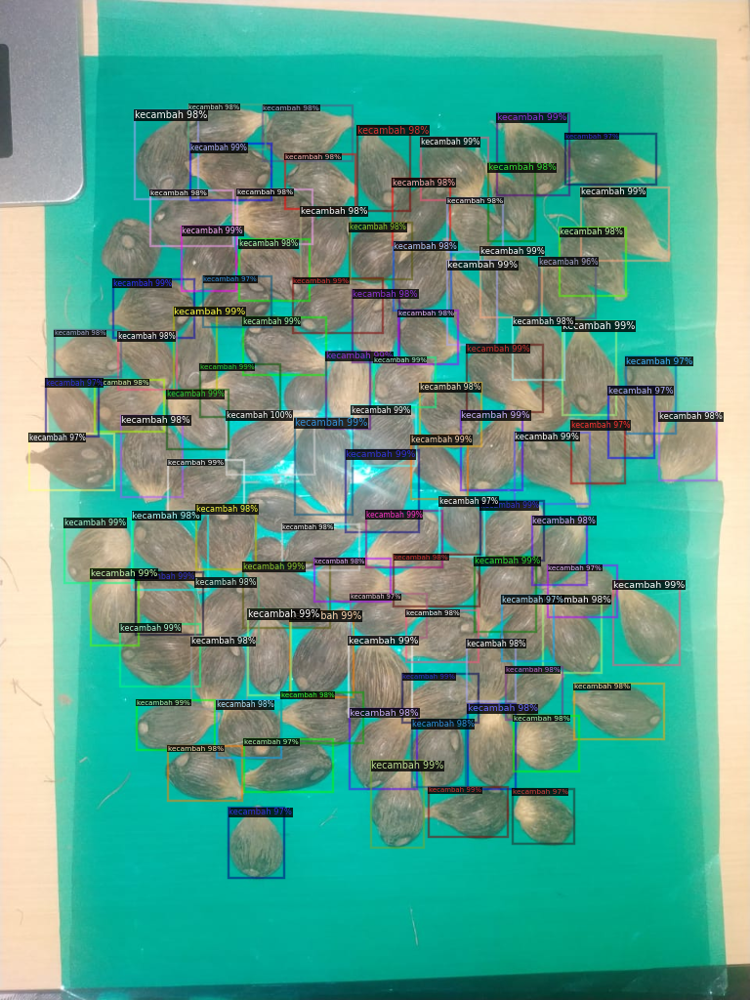

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/drive/MyDrive/labeldatasawit1/WhatsApp Image 2022-10-13 at 2.18.21 PM (1).jpeg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir outputImages
import cv2

vidcap = cv2.VideoCapture("/content/drive/MyDrive/video-output.mp4")
success,im = vidcap.read()

n = 1

while success:

  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

  
  fileDir = 'outputImages/'+str(n)+'.jpg'
  cv2.imwrite(fileDir, out.get_image()[:, :, ::-1]) 

  n += 1
  print("Frame "+str(n)+" completed")
  success,im = vidcap.read()

import cv2
import imageio
import numpy as np

print("Total frames: "+str(n))

with imageio.get_writer("out2.mp4", mode = 'I') as writer:
  for i in range(1,n):
    frame = cv2.imread('outputImages/'+str(i)+'.jpg')
    frame = frame[:, :, [2, 1, 0]]
    writer.append_data(frame)
    print("Frame "+str(i)+" completed")  

In [ ]:
# use this to download a file  
def download(path):
  from google.colab import files
  files.download(path)

In [ ]:
download("out2.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>